# Percobaan 2
Grayscale → Sharpening → Thresholding

## 1. Import Library

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy as scipy_entropy

## 2. Fungsi Preprocessing

Di sini kita mendefinisikan tiga fungsi preprocessing yang akan dipakai dalam pipeline percobaan ini.

Fungsi pertama, `to_grayscale`, mengonversi gambar dari format BGR (format default OpenCV) ke grayscale menggunakan `cv2.cvtColor`.

Fungsi kedua, `sharpening_manual`, melakukan proses sharpening secara manual piksel per piksel menggunakan kernel Laplacian berukuran 3x3. Kernel ini bekerja dengan cara memperkuat perbedaan antara piksel tengah dan piksel-piksel di sekitarnya, sehingga tepi dan tekstur gambar menjadi lebih tajam. Padding diterapkan di pinggir gambar sebelum konvolusi agar piksel di tepi tetap ikut diproses.

Fungsi ketiga, `thresholding_manual`, melakukan binerisasi gambar secara manual juga piksel per piksel. Piksel dengan nilai di atas batas (default 127) akan menjadi putih (255), sedangkan yang di bawah atau sama dengan batas akan menjadi hitam (0).

In [3]:
def to_grayscale(img_bgr):
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)


def sharpening_manual(img_gray):
    kernel = np.array([
        [ 0, -1,  0],
        [-1,  5, -1],
        [ 0, -1,  0]
    ], dtype=np.float32)

    tinggi, lebar = img_gray.shape
    pad    = 1
    padded = np.pad(img_gray, pad, mode='edge').astype(np.float32)
    hasil  = np.zeros_like(img_gray, dtype=np.float32)

    for i in range(tinggi):
        for j in range(lebar):
            region      = padded[i:i+3, j:j+3]   # patch 3x3
            nilai       = np.sum(region * kernel) # konvolusi manual
            hasil[i, j] = nilai

    # Clip ke rentang valid 0–255
    hasil = np.clip(hasil, 0, 255).astype(np.uint8)
    return hasil


def thresholding_manual(img_gray, batas=127):
    tinggi, lebar = img_gray.shape
    hasil = np.zeros_like(img_gray, dtype=np.uint8)

    for i in range(tinggi):
        for j in range(lebar):
            if img_gray[i, j] > batas:
                hasil[i, j] = 255
            else:
                hasil[i, j] = 0

    return hasil


print('Fungsi preprocessing berhasil didefinisikan.')

Fungsi preprocessing berhasil didefinisikan.


## 3. Load Dataset

Bagian ini bertugas membaca gambar dari folder dataset. Kita set jumlah gambar per label sebanyak 80, dengan dua label yaitu `Benign` dan `Malignant`. Fungsi `load_images` akan mencari semua file `.jpg` di dalam folder yang ditentukan, membacanya dengan `cv2.imread`, lalu menyimpannya beserta nama filenya. Hasilnya disimpan dalam dictionary `data` yang berisi gambar dan nama file untuk masing-masing label.

In [4]:
TRAIN_PATH  = os.path.join('Dataset', 'Train') 
N_PER_LABEL = 80

LABELS = {
    'Benign'    : 'benign',
    'Malignant' : 'malignant'
}

def load_images(folder_path, n):
    images, filenames = [], []
    files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith('.jpg')
    ])[:n]
    for fname in files:
        img = cv2.imread(os.path.join(folder_path, fname))
        if img is not None:
            images.append(img)
            filenames.append(fname)
    return images, filenames

data = {}
for label, subfolder in LABELS.items():
    folder = os.path.join(TRAIN_PATH, subfolder)
    imgs, fnames = load_images(folder, N_PER_LABEL)
    data[label] = {'images': imgs, 'filenames': fnames}
    print(f'[{label}] Dimuat: {len(imgs)} gambar')

print(f'\nTotal gambar: {sum(len(v["images"]) for v in data.values())}')

[Benign] Dimuat: 80 gambar
[Malignant] Dimuat: 80 gambar

Total gambar: 160


## 4. Jalankan Pipeline Preprocessing

Di sini kita menjalankan pipeline preprocessing secara bertahap untuk semua gambar yang sudah dimuat. Setiap gambar diproses dalam tiga langkah berurutan: pertama dikonversi ke grayscale, lalu di-sharpening, dan terakhir di-thresholding. Hasil dari setiap tahap disimpan ke dalam list terpisah (`gray_list`, `sharp_list`, `thresh_list`) agar bisa dibandingkan nanti. Karena sharpening dan thresholding dilakukan piksel per piksel, proses ini membutuhkan waktu lebih lama dari biasanya.

In [5]:
for label in data:
    print(f'\nMemproses label: {label} ...')
    gray_list   = []
    sharp_list  = []
    thresh_list = []

    for idx, img in enumerate(data[label]['images']):
        # Step 1 – Grayscale
        gray = to_grayscale(img)

        # Step 2 – Sharpening
        sharp = sharpening_manual(gray)

        # Step 3 – Thresholding
        thresh = thresholding_manual(sharp, batas=127)

        gray_list.append(gray)
        sharp_list.append(sharp)
        thresh_list.append(thresh)

        if (idx + 1) % 10 == 0:
            print(f'  {idx + 1}/{len(data[label]["images"])} gambar selesai')

    data[label]['gray']   = gray_list
    data[label]['sharp']  = sharp_list
    data[label]['thresh'] = thresh_list
    print(f'[{label}] Preprocessing selesai.')

print('\nSemua gambar selesai diproses!')


Memproses label: Benign ...
  10/80 gambar selesai
  20/80 gambar selesai
  30/80 gambar selesai
  40/80 gambar selesai
  50/80 gambar selesai
  60/80 gambar selesai
  70/80 gambar selesai
  80/80 gambar selesai
[Benign] Preprocessing selesai.

Memproses label: Malignant ...
  10/80 gambar selesai
  20/80 gambar selesai
  30/80 gambar selesai
  40/80 gambar selesai
  50/80 gambar selesai
  60/80 gambar selesai
  70/80 gambar selesai
  80/80 gambar selesai
[Malignant] Preprocessing selesai.

Semua gambar selesai diproses!


## 5. Visualisasi Perbandingan (5 Contoh per Label)

Untuk memastikan setiap tahap preprocessing berjalan dengan benar, kita tampilkan 5 gambar sampel untuk masing-masing label. Visualisasi dibuat dalam grid 4 baris (Original, Grayscale, Sharpening, Thresholding) dan 5 kolom, sehingga kita bisa melihat langsung perubahan gambar di setiap tahap pipeline.

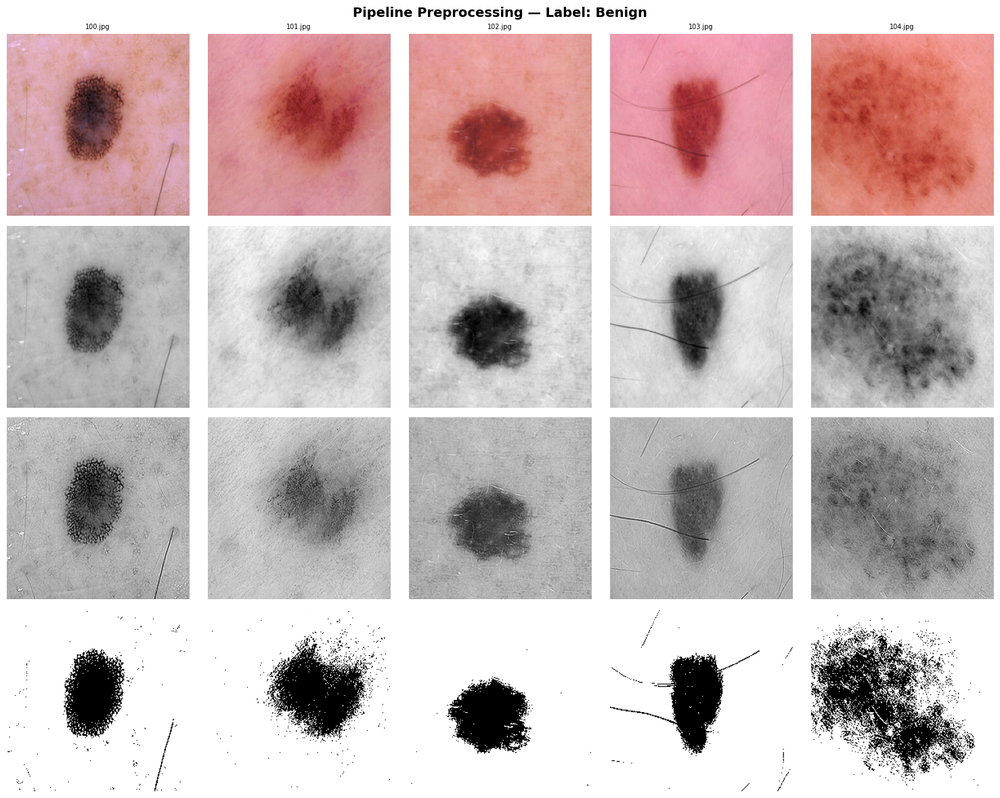

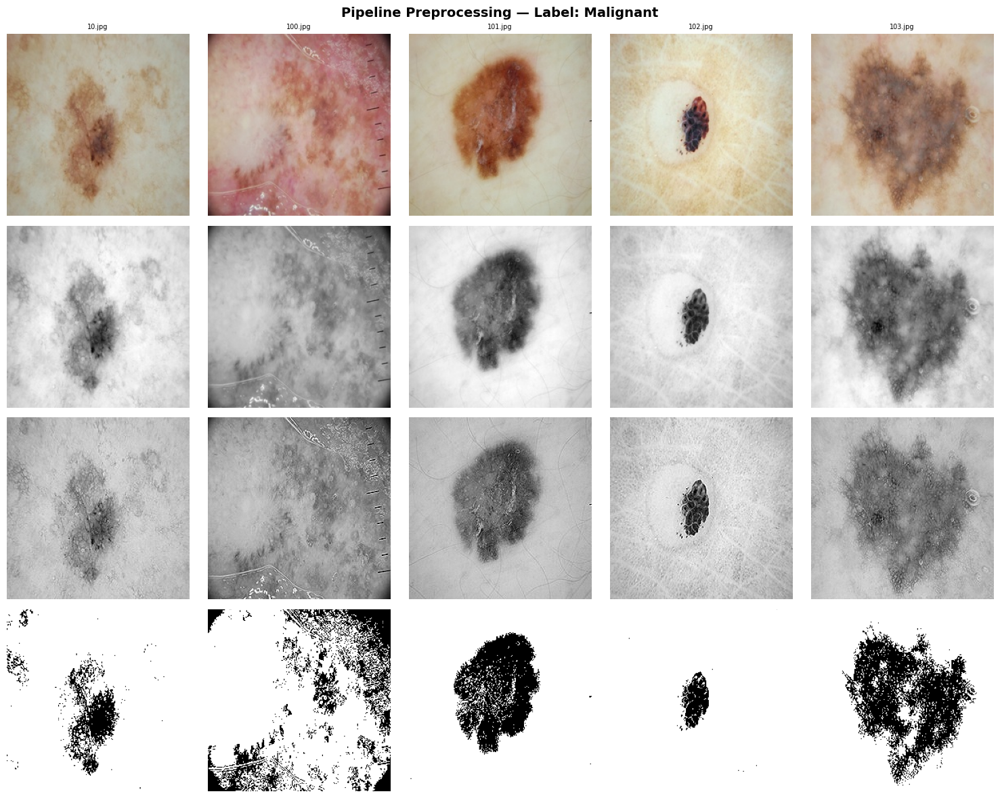

In [6]:
N = 5
stages = [
    ('Original (BGR→RGB)', lambda lbl: [cv2.cvtColor(i, cv2.COLOR_BGR2RGB) for i in data[lbl]['images'][:N]], False),
    ('Grayscale',          lambda lbl: data[lbl]['gray'][:N],   True),
    ('Sharpening (Manual)',lambda lbl: data[lbl]['sharp'][:N],  True),
    ('Thresholding (Manual)', lambda lbl: data[lbl]['thresh'][:N], True),
]

for label in data:
    fig, axes = plt.subplots(4, N, figsize=(N * 3, 12))
    fig.suptitle(f'Pipeline Preprocessing — Label: {label}',
                 fontsize=14, fontweight='bold')

    for row, (title, img_fn, is_gray) in enumerate(stages):
        imgs = img_fn(label)
        for col in range(N):
            ax = axes[row, col]
            ax.imshow(imgs[col], cmap='gray' if is_gray else None)
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(title, fontsize=9, fontweight='bold')
            if row == 0:
                ax.set_title(data[label]['filenames'][col], fontsize=7)

    plt.tight_layout()
    plt.show()

## 6. Visualisasi Semua 80 Gambar Hasil Thresholding — Benign

Setelah yakin preprocessing berjalan dengan benar, kita tampilkan seluruh 80 gambar hasil thresholding untuk label Benign dalam satu grid. Fungsi `plot_all` mengatur gambar dalam 10 kolom secara otomatis, menyesuaikan jumlah baris dengan jumlah gambar yang ada.

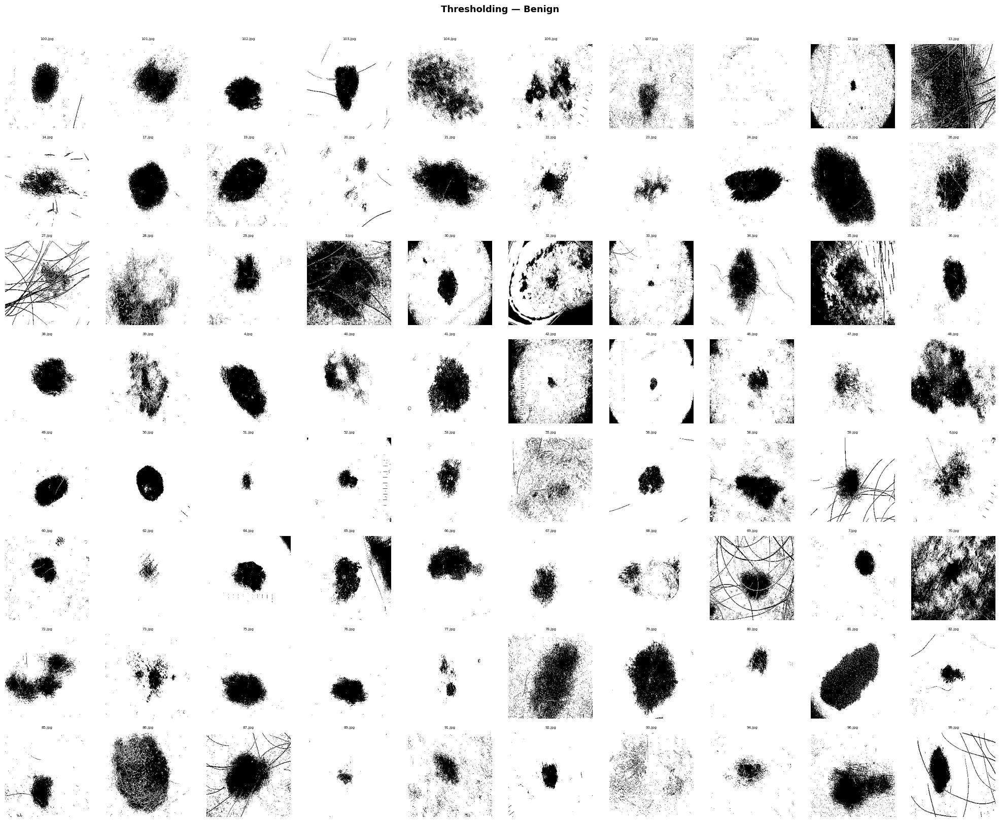

In [7]:
def plot_all(imgs, filenames, label, stage, cols=10):
    n    = len(imgs)
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    fig.suptitle(f'{stage} — {label}',
                 fontsize=13, fontweight='bold', y=1.01)
    for i, ax in enumerate(axes.flatten()):
        if i < n:
            ax.imshow(imgs[i], cmap='gray')
            ax.set_title(filenames[i], fontsize=5)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_all(data['Benign']['thresh'], data['Benign']['filenames'],
         'Benign', 'Thresholding')

## 7. Visualisasi Semua 80 Gambar Hasil Thresholding — Malignant

Hal yang sama dilakukan untuk label Malignant, yaitu menampilkan seluruh 80 gambar hasil thresholding dalam satu grid agar bisa dibandingkan secara visual dengan gambar Benign.

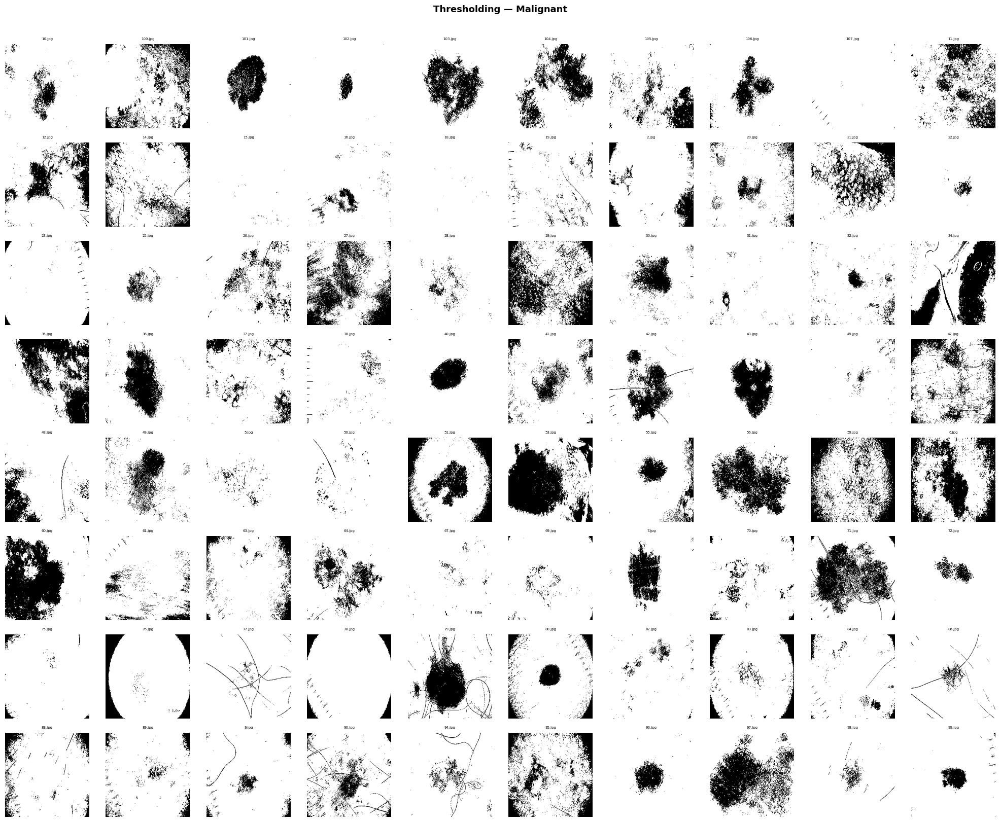

In [8]:
plot_all(data['Malignant']['thresh'], data['Malignant']['filenames'],
         'Malignant', 'Thresholding')

## 8. Visualisasi Semua Tahap per Label

Di sini kita menampilkan semua 80 gambar untuk setiap tahap preprocessing (Grayscale, Sharpening, Thresholding) per label. Ini berguna untuk melihat secara menyeluruh bagaimana tiap tahap mengubah tampilan gambar di seluruh dataset, bukan hanya 5 sampel seperti sebelumnya.

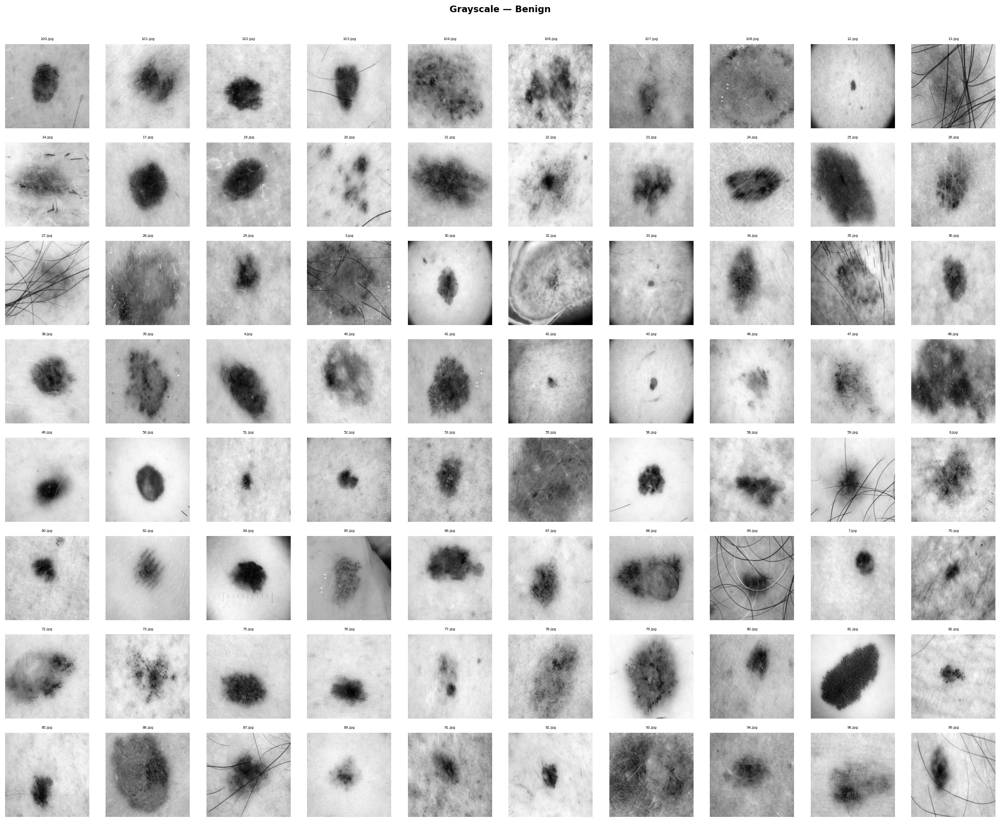

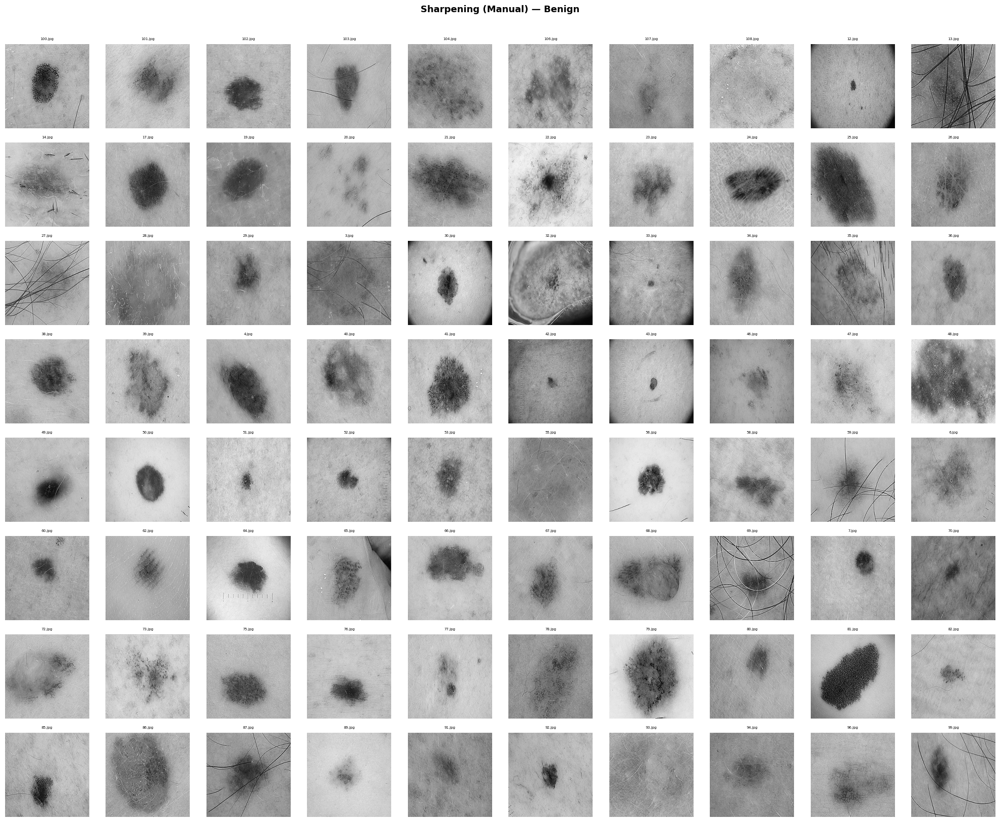

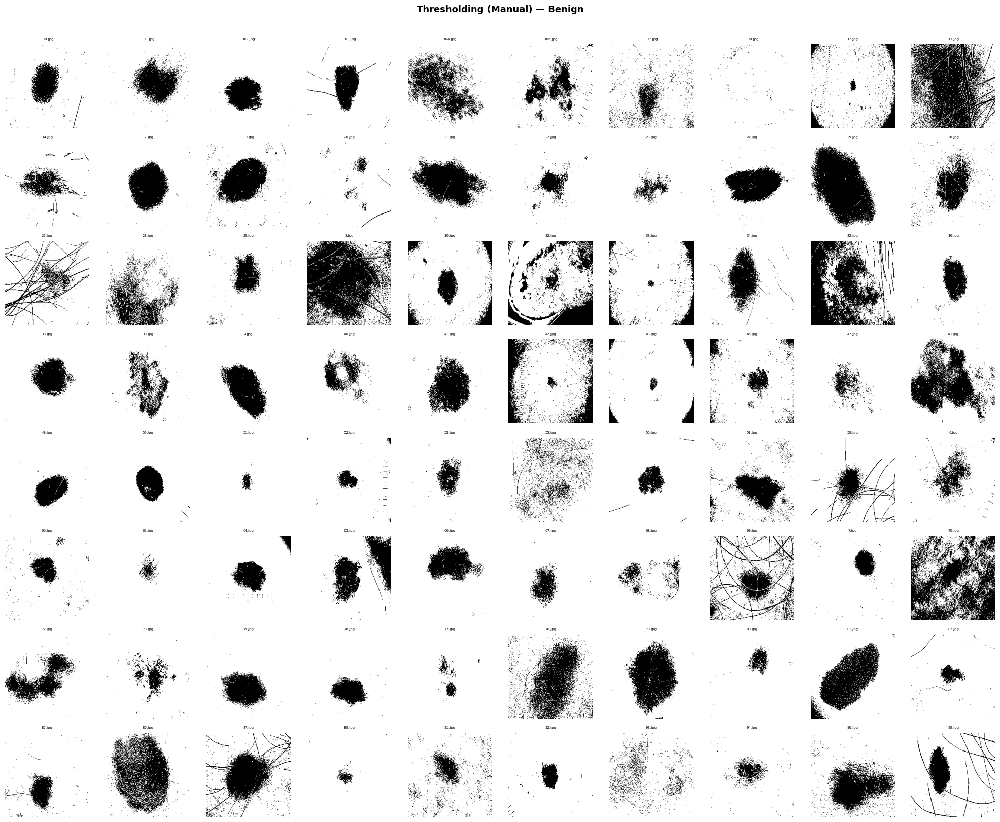

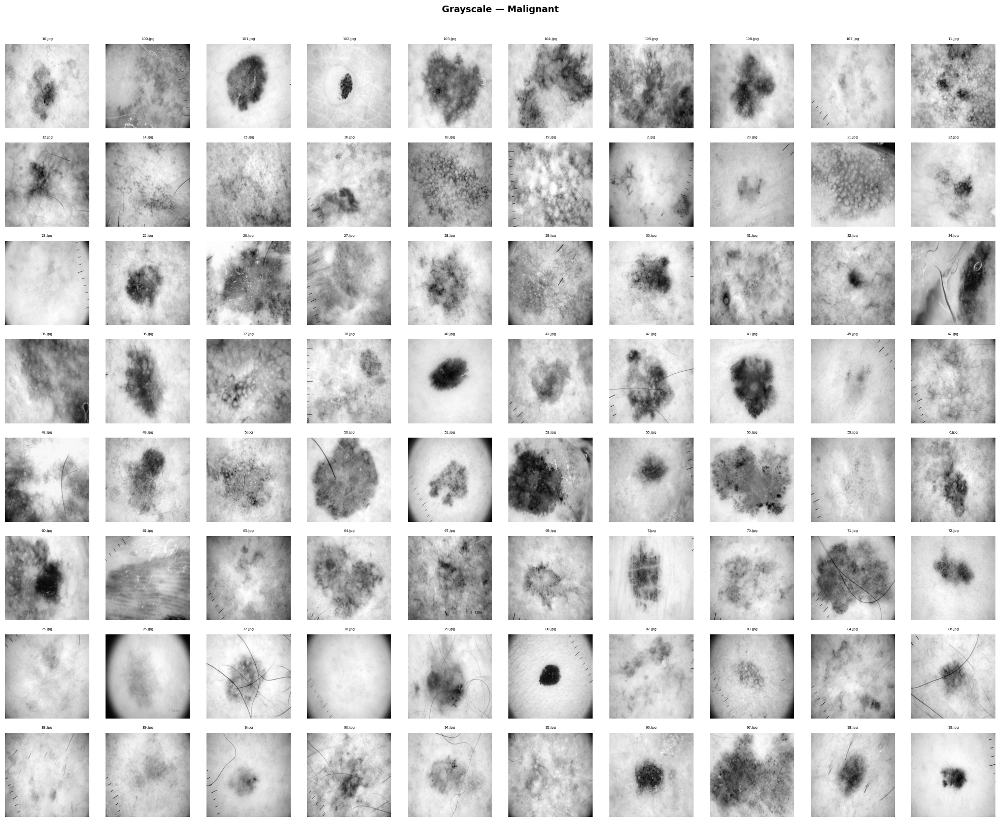

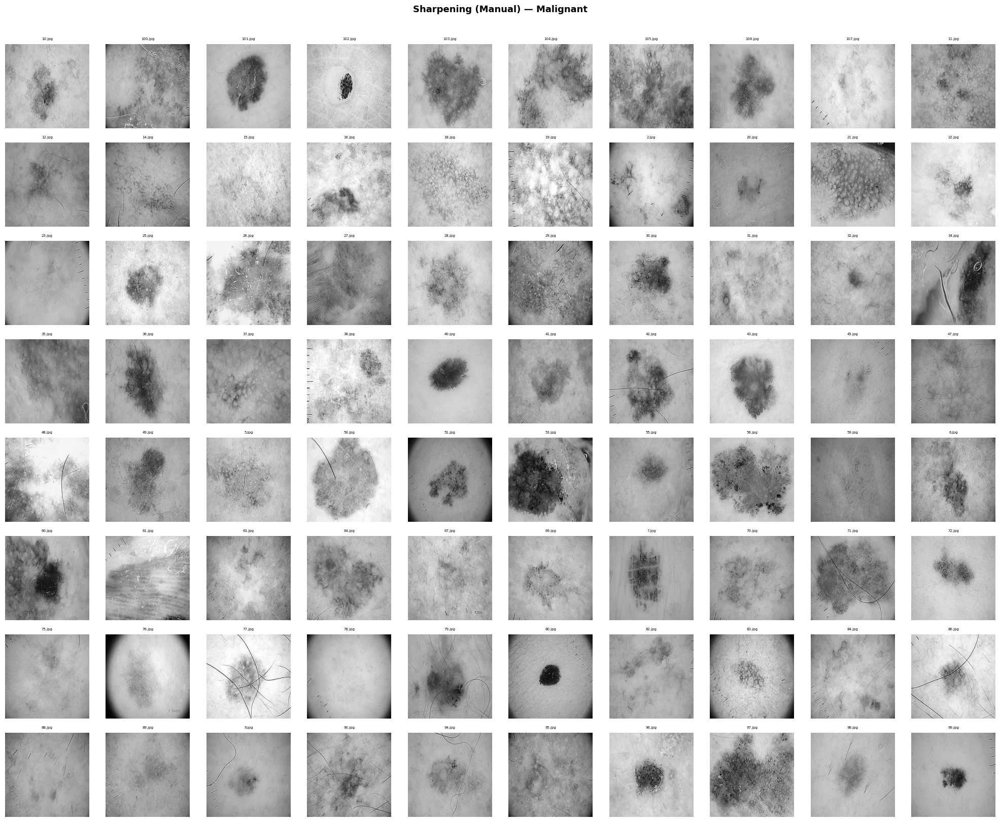

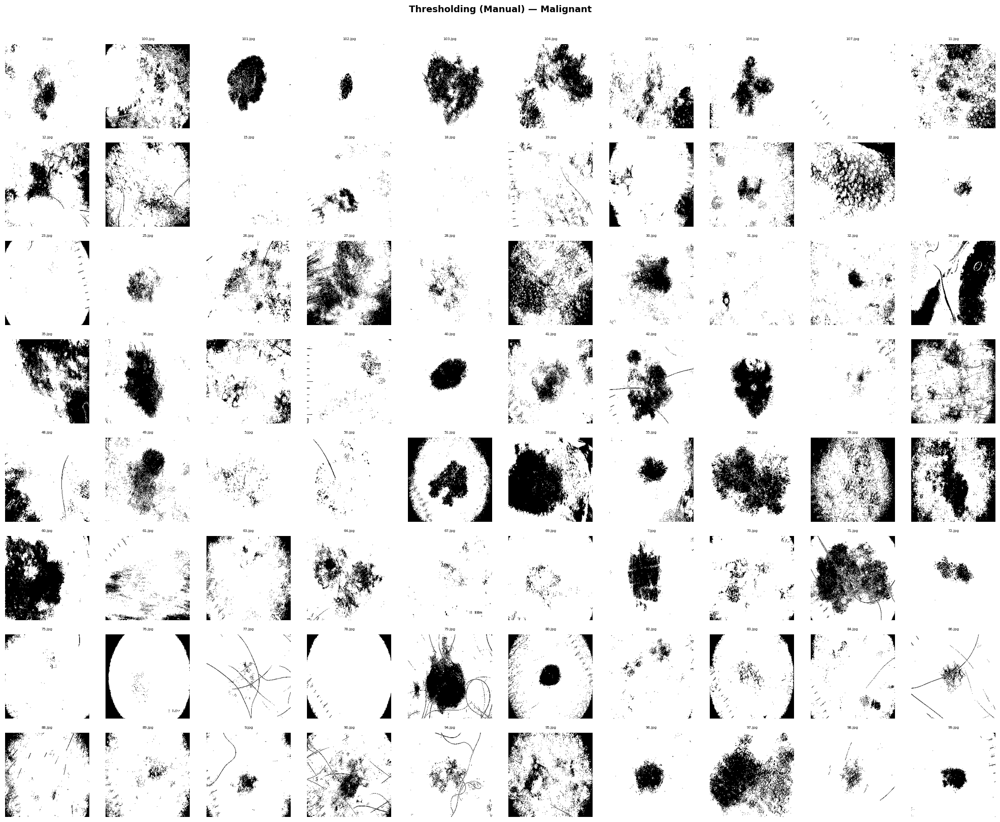

In [9]:
for label in data:
    for stage_key, stage_name in [('gray','Grayscale'), ('sharp','Sharpening (Manual)'), ('thresh','Thresholding (Manual)')]:
        plot_all(data[label][stage_key], data[label]['filenames'],
                 label, stage_name)

## 9. Ekstraksi Fitur

Setelah preprocessing selesai, kita masuk ke tahap ekstraksi fitur menggunakan GLCM (Gray Level Co-occurrence Matrix). Fungsi `hitung_glcm` membangun matriks GLCM secara manual dari gambar grayscale dengan cara menghitung pasangan piksel bertetangga berdasarkan jarak dan sudut tertentu. Gambar terlebih dahulu dikuantisasi ke 8 level intensitas agar ukuran matriks GLCM tidak terlalu besar. Setelah terbentuk, matriks disimetriskan dan dinormalisasi agar nilainya merepresentasikan probabilitas.

Fungsi `ekstrak_fitur_glcm` kemudian menghitung empat fitur tekstur dari matriks GLCM tersebut, yaitu contrast, correlation, energy, dan homogeneity. Fitur-fitur ini nantinya akan dipakai sebagai input ke model klasifikasi.

In [25]:
def hitung_glcm(img_gray, jarak=1, sudut=0):
    # Kuantisasi ke 8 level agar GLCM tidak terlalu besar
    level = 8
    img_q = (img_gray / 32).astype(np.uint8)  # 0–255 → 0–7

    glcm = np.zeros((level, level), dtype=np.float64)

    # Tentukan arah offset berdasarkan sudut
    if sudut == 0:
        dx, dy = jarak, 0
    elif sudut == 45:
        dx, dy = jarak, -jarak
    elif sudut == 90:
        dx, dy = 0, jarak
    elif sudut == 135:
        dx, dy = -jarak, jarak
    else:
        dx, dy = jarak, 0

    tinggi, lebar = img_q.shape
    for i in range(tinggi):
        for j in range(lebar):
            ni = i + dy
            nj = j + dx
            if 0 <= ni < tinggi and 0 <= nj < lebar:
                val_i = img_q[i, j]
                val_j = img_q[ni, nj]
                glcm[val_i, val_j] += 1

    # Simetriskan dan normalisasi
    glcm = glcm + glcm.T
    total = glcm.sum()
    if total > 0:
        glcm = glcm / total

    return glcm


def ekstrak_fitur_glcm(glcm):
    level = glcm.shape[0]
    contrast    = 0.0
    correlation = 0.0
    energy      = 0.0
    homogeneity = 0.0

    # Hitung mean dan std untuk correlation
    ix = np.arange(level)
    iy = np.arange(level)
    mean_x = np.sum(ix * glcm.sum(axis=1))
    mean_y = np.sum(iy * glcm.sum(axis=0))
    std_x  = np.sqrt(np.sum(((ix - mean_x) ** 2) * glcm.sum(axis=1)))
    std_y  = np.sqrt(np.sum(((iy - mean_y) ** 2) * glcm.sum(axis=0)))

    for i in range(level):
        for j in range(level):
            p = glcm[i, j]
            contrast    += p * (i - j) ** 2
            energy      += p ** 2
            homogeneity += p / (1 + abs(i - j))
            if std_x > 0 and std_y > 0:
                correlation += p * ((i - mean_x) * (j - mean_y)) / (std_x * std_y)

    return {
        'contrast'    : contrast,
        'correlation' : correlation,
        'energy'      : energy,
        'homogeneity' : homogeneity
    }


def glcm_skimage(image, derajat):
    angles_map = {0: [0], 45: [np.pi/4], 90: [np.pi/2], 135: [3*np.pi/4]}
    return graycomatrix(image, [1], angles_map[derajat], 256, symmetric=True, normed=True)

def glcm_skimage(image, derajat):
    angles_map = {0: [0], 45: [np.pi/4], 90: [np.pi/2], 135: [3*np.pi/4]}
    return graycomatrix(image, [1], angles_map[derajat], 256, symmetric=True, normed=True)

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

def correlation(matriks):
    return graycoprops(matriks, 'correlation')[0, 0]

def entropyGlcm(matriks):
    return scipy_entropy(matriks.ravel())

In [26]:
SUDUT = [0, 45, 90, 135]

all_fitur    = []  # list fitur semua gambar
all_label    = []  # list label (0 = Benign, 1 = Malignant)
label_encode = {'Benign': 0, 'Malignant': 1}

for label in data:
    print(f'Mengekstrak fitur GLCM — {label} ...')
    for idx, img_thresh in enumerate(data[label]['sharp']):
        fitur_per_sudut = []
        for sudut in SUDUT:
            glcm  = hitung_glcm(img_thresh, jarak=1, sudut=sudut)
            fitur = ekstrak_fitur_glcm(glcm)
            fitur_per_sudut.append(list(fitur.values()))

        # Rata-rata fitur dari 4 sudut
        fitur_avg = np.mean(fitur_per_sudut, axis=0)
        all_fitur.append(fitur_avg)
        all_label.append(label_encode[label])

        if (idx + 1) % 20 == 0:
            print(f'  {idx + 1}/{len(data[label]["thresh"])} selesai')

    print(f'[{label}] Ekstraksi selesai.')

all_fitur = np.array(all_fitur)
all_label = np.array(all_label)

print(f'\nShape fitur : {all_fitur.shape}')  # (160, 4)
print(f'Shape label : {all_label.shape}')   # (160,)

df_fitur = pd.DataFrame(all_fitur, columns=['Contrast', 'Correlation', 'Energy', 'Homogeneity'])
df_fitur['Label'] = ['Benign' if l == 0 else 'Malignant' for l in all_label]
print(df_fitur.head(10).to_string(index=False))
print(df_fitur.tail(10).to_string(index=False))

Mengekstrak fitur GLCM — Benign ...
  20/80 selesai
  40/80 selesai
  60/80 selesai
  80/80 selesai
[Benign] Ekstraksi selesai.
Mengekstrak fitur GLCM — Malignant ...
  20/80 selesai
  40/80 selesai
  60/80 selesai
  80/80 selesai
[Malignant] Ekstraksi selesai.

Shape fitur : (160, 4)
Shape label : (160,)
 Contrast  Correlation   Energy  Homogeneity  Label
 0.686916     0.776260 0.289914     0.800883 Benign
 0.391048     0.793480 0.234641     0.833025 Benign
 0.213688     0.881581 0.496511     0.905745 Benign
 0.350538     0.812121 0.453126     0.884870 Benign
 0.486681     0.686510 0.148010     0.795666 Benign
 0.479988     0.720214 0.210093     0.820767 Benign
 0.532419     0.398048 0.226869     0.785795 Benign
 0.658137     0.261705 0.198560     0.768373 Benign
 0.626339     0.681678 0.156415     0.759935 Benign
 1.894177     0.502085 0.074846     0.687233 Benign
 Contrast  Correlation   Energy  Homogeneity     Label
 0.365131     0.661689 0.267064     0.873479 Malignant
 0.308302  

## 10. Simpan Fitur Train ke CSV

Hasil ekstraksi fitur dari data train disimpan ke file CSV bernama `fitur_train.csv`. Ini berguna sebagai backup dan memudahkan analisis lanjutan tanpa perlu menjalankan ulang proses ekstraksi yang memakan waktu.

In [23]:
df_fitur.to_csv('fitur_train.csv', index=False)
print('Fitur train disimpan ke fitur_train.csv')
print(f'Jumlah baris: {len(df_fitur)}')
df_fitur.head()

Fitur train disimpan ke fitur_train.csv
Jumlah baris: 160


,Contrast,Correlation,Energy,Homogeneity,Label
0,0.686916,0.776260,0.289914,0.800883,Benign
1,0.391048,0.793480,0.234641,0.833025,Benign
2,0.213688,0.881581,0.496511,0.905745,Benign
3,0.350538,0.812121,0.453126,0.884870,Benign
4,0.486681,0.686510,0.148010,0.795666,Benign


## 11. Load & Preprocessing Dataset Test
Folder `Dataset/Test/` berisi **216 gambar tanpa label** (tidak dipisah per kelas).
Karena tidak ada ground truth, dataset ini akan digunakan untuk **prediksi murni** (bukan evaluasi akurasi). Evaluasi model tetap dilakukan menggunakan **split dari data Train**.

Berbeda dengan folder Train yang gambarnya sudah dipisah per label, folder Test berisi 216 gambar yang tercampur tanpa subfolder label. Karena tidak ada ground truth, data Test tidak bisa dipakai untuk menghitung akurasi model. Fungsi `load_images_flat` membaca semua gambar langsung dari satu folder tanpa perlu iterasi subfolder.

In [12]:
TEST_PATH = os.path.join('Dataset', 'Test')  # Dataset/Test/ — semua gambar campur, tanpa label

def load_images_flat(folder_path):
    images, filenames = [], []
    files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith('.jpg')
    ])
    for fname in files:
        img = cv2.imread(os.path.join(folder_path, fname))
        if img is not None:
            images.append(img)
            filenames.append(fname)
    return images, filenames

test_images, test_filenames = load_images_flat(TEST_PATH)
print(f'Total gambar Test (tanpa label): {len(test_images)}')

Total gambar Test (tanpa label): 216


Pipeline preprocessing yang sama (Grayscale, Sharpening, Thresholding) dijalankan juga untuk data Test agar formatnya konsisten dengan data Train sebelum masuk ke tahap ekstraksi fitur dan prediksi.

In [13]:
print('Memproses gambar Test ...')
test_gray, test_sharp, test_thresh = [], [], []

for idx, img in enumerate(test_images):
    gray   = to_grayscale(img)
    sharp  = sharpening_manual(gray)
    thresh = thresholding_manual(sharp, batas=127)

    test_gray.append(gray)
    test_sharp.append(sharp)
    test_thresh.append(thresh)

    if (idx + 1) % 20 == 0:
        print(f'  {idx + 1}/{len(test_images)} gambar selesai')

print('\nSemua gambar Test selesai diproses!')

Memproses gambar Test ...
  20/216 gambar selesai
  40/216 gambar selesai
  60/216 gambar selesai
  80/216 gambar selesai
  100/216 gambar selesai
  120/216 gambar selesai
  140/216 gambar selesai
  160/216 gambar selesai
  180/216 gambar selesai
  200/216 gambar selesai

Semua gambar Test selesai diproses!


## 12. Ekstraksi Fitur GLCM (Data Test Tanpa Label)

Fitur GLCM diekstrak dari gambar Test yang sudah dipreprocessing. Ekstraksi dilakukan dari 4 sudut (0°, 45°, 90°, 135°) lalu dirata-rata agar hasilnya lebih representatif dan tidak bergantung pada satu arah tekstur saja. Hasilnya disimpan ke `fitur_test.csv`.

In [29]:
all_fitur_test = []

for idx, img_sharp in enumerate(test_sharp):
    fitur_per_sudut = []
    for sudut in SUDUT:
        glcm  = hitung_glcm(img_sharp, jarak=1, sudut=sudut)
        fitur = ekstrak_fitur_glcm(glcm)
        fitur_per_sudut.append(list(fitur.values()))

    fitur_avg = np.mean(fitur_per_sudut, axis=0)
    all_fitur_test.append(fitur_avg)

    if (idx + 1) % 20 == 0:
        print(f'  {idx + 1}/{len(test_sharp)} selesai')

all_fitur_test = np.array(all_fitur_test)

# ── hasil_ekstraksi_2.csv (format seperti Percobaan3, 4 sudut terpisah) ──
Derajat0_test, Derajat45_test, Derajat90_test, Derajat135_test = [], [], [], []
for img in test_sharp:
    Derajat0_test.append(glcm_skimage(img, 0))
    Derajat45_test.append(glcm_skimage(img, 45))
    Derajat90_test.append(glcm_skimage(img, 90))
    Derajat135_test.append(glcm_skimage(img, 135))

dataTable_test = {
    'Filename': test_filenames, 'Label': ['Test'] * len(test_filenames),
    'Contrast0':     [contrast(d) for d in Derajat0_test],
    'Contrast45':    [contrast(d) for d in Derajat45_test],
    'Contrast90':    [contrast(d) for d in Derajat90_test],
    'Contrast135':   [contrast(d) for d in Derajat135_test],
    'Homogeneity0':  [homogenity(d) for d in Derajat0_test],
    'Homogeneity45': [homogenity(d) for d in Derajat45_test],
    'Homogeneity90': [homogenity(d) for d in Derajat90_test],
    'Homogeneity135':[homogenity(d) for d in Derajat135_test],
    'Dissimilarity0':  [dissimilarity(d) for d in Derajat0_test],
    'Dissimilarity45': [dissimilarity(d) for d in Derajat45_test],
    'Dissimilarity90': [dissimilarity(d) for d in Derajat90_test],
    'Dissimilarity135':[dissimilarity(d) for d in Derajat135_test],
    'Entropy0':  [entropyGlcm(d) for d in Derajat0_test],
    'Entropy45': [entropyGlcm(d) for d in Derajat45_test],
    'Entropy90': [entropyGlcm(d) for d in Derajat90_test],
    'Entropy135':[entropyGlcm(d) for d in Derajat135_test],
    'ASM0':  [ASM(d) for d in Derajat0_test],
    'ASM45': [ASM(d) for d in Derajat45_test],
    'ASM90': [ASM(d) for d in Derajat90_test],
    'ASM135':[ASM(d) for d in Derajat135_test],
    'Energy0':  [energy(d) for d in Derajat0_test],
    'Energy45': [energy(d) for d in Derajat45_test],
    'Energy90': [energy(d) for d in Derajat90_test],
    'Energy135':[energy(d) for d in Derajat135_test],
    'Correlation0':  [correlation(d) for d in Derajat0_test],
    'Correlation45': [correlation(d) for d in Derajat45_test],
    'Correlation90': [correlation(d) for d in Derajat90_test],
    'Correlation135':[correlation(d) for d in Derajat135_test],
}
df_test_full = pd.DataFrame(dataTable_test)
df_test_full.to_csv('hasil_ekstraksi_2.csv', index=False)
print('Disimpan ke hasil_ekstraksi_2.csv')

df_fitur_test = df_test_full.copy()
df_fitur_test.to_csv('hasil_ekstraksi_percobaan2.csv', index=False)
print(f'Disimpan ke hasil_ekstraksi_percobaan2.csv — {len(df_fitur_test)} baris')
display(df_fitur_test.head())

display(df_test_full.head())

  20/216 selesai
  40/216 selesai
  60/216 selesai
  80/216 selesai
  100/216 selesai
  120/216 selesai
  140/216 selesai
  160/216 selesai
  180/216 selesai
  200/216 selesai
Disimpan ke hasil_ekstraksi_2.csv
Disimpan ke hasil_ekstraksi_percobaan2.csv — 216 baris


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,1.jpg,Test,207.879124,214.755575,176.299107,220.057009,0.109268,0.109326,0.118504,0.108489,...,0.000553,0.000519,0.022589,0.022719,0.023513,0.022783,0.952834,0.951378,0.959972,0.950178
1,10.jpg,Test,357.608444,235.514609,252.963765,421.315329,0.090443,0.106563,0.097809,0.083107,...,0.000638,0.000582,0.024575,0.025942,0.025250,0.024116,0.763540,0.844732,0.832614,0.722238
2,108.jpg,Test,162.912876,170.657222,186.984485,230.367411,0.183844,0.164453,0.186850,0.162943,...,0.000932,0.000827,0.030403,0.028674,0.030528,0.028754,0.894522,0.889925,0.878973,0.851411
3,109.jpg,Test,505.465387,828.779967,676.241152,482.581090,0.109704,0.090817,0.111093,0.096910,...,0.000332,0.000298,0.017996,0.016864,0.018232,0.017249,0.674483,0.467020,0.566538,0.689665
4,11.jpg,Test,1493.622257,1479.270084,742.948631,1362.204066,0.076200,0.080123,0.089905,0.077856,...,0.000202,0.000168,0.012902,0.013066,0.014227,0.012966,0.558369,0.562716,0.780323,0.597323


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,1.jpg,Test,207.879124,214.755575,176.299107,220.057009,0.109268,0.109326,0.118504,0.108489,...,0.000553,0.000519,0.022589,0.022719,0.023513,0.022783,0.952834,0.951378,0.959972,0.950178
1,10.jpg,Test,357.608444,235.514609,252.963765,421.315329,0.090443,0.106563,0.097809,0.083107,...,0.000638,0.000582,0.024575,0.025942,0.025250,0.024116,0.763540,0.844732,0.832614,0.722238
2,108.jpg,Test,162.912876,170.657222,186.984485,230.367411,0.183844,0.164453,0.186850,0.162943,...,0.000932,0.000827,0.030403,0.028674,0.030528,0.028754,0.894522,0.889925,0.878973,0.851411
3,109.jpg,Test,505.465387,828.779967,676.241152,482.581090,0.109704,0.090817,0.111093,0.096910,...,0.000332,0.000298,0.017996,0.016864,0.018232,0.017249,0.674483,0.467020,0.566538,0.689665
4,11.jpg,Test,1493.622257,1479.270084,742.948631,1362.204066,0.076200,0.080123,0.089905,0.077856,...,0.000202,0.000168,0.012902,0.013066,0.014227,0.012966,0.558369,0.562716,0.780323,0.597323


## 13. Klasifikasi: Random Forest, KNN, dan SVM
Karena data Test tidak berlabel, model dilatih dan **dievaluasi menggunakan split dari data Train** (train/test split internal). Setelah itu, model terbaik dipakai untuk **memprediksi data Test** (`Dataset/Test/`) yang labelnya tidak diketahui.

Karena data Test tidak berlabel, evaluasi model dilakukan menggunakan split internal dari data Train (80% untuk training, 20% untuk validasi). Fitur kemudian distandarisasi menggunakan `StandardScaler` agar distribusi nilainya konsisten, yang penting terutama untuk SVM dan KNN yang sensitif terhadap skala fitur.

In [15]:
# Split data Train (yang berlabel) menjadi train & validation set
X_train_full, y_train_full = all_fitur, all_label

X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42, stratify=y_train_full
)

# Standardisasi (fit hanya pada X_train)
scaler  = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val   = scaler.transform(X_val)
X_test_unlabeled = scaler.transform(all_fitur_test)  # data Test tanpa label

print(f'X_train shape : {X_train.shape}')
print(f'X_val shape   : {X_val.shape}')
print(f'X_test (unlabeled) shape : {X_test_unlabeled.shape}')

X_train shape : (128, 4)
X_val shape   : (32, 4)
X_test (unlabeled) shape : (216, 4)


Tiga model klasifikasi dilatih sekaligus, yaitu Random Forest, KNN, dan SVM. Setiap model dilatih menggunakan data train, dievaluasi menggunakan validation set (yang punya label asli), lalu dipakai untuk memprediksi data Test (yang tidak berlabel). Hasil evaluasi dan prediksi masing-masing model disimpan untuk perbandingan.

In [16]:
models = {
    'Random Forest' : RandomForestClassifier(n_estimators=100, random_state=42),
    'KNN'            : KNeighborsClassifier(n_neighbors=5),
    'SVM'            : SVC(kernel='rbf', random_state=42)
}

hasil_akurasi  = {}
hasil_prediksi = {}      # prediksi pada validation set (ada label asli)
prediksi_test  = {}       # prediksi pada Dataset/Test (tanpa label)

for nama, model in models.items():
    model.fit(X_train, y_train)

    # Evaluasi pada validation set
    y_val_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_val_pred)
    hasil_akurasi[nama]  = acc
    hasil_prediksi[nama] = y_val_pred

    # Prediksi pada data Test tanpa label
    prediksi_test[nama] = model.predict(X_test_unlabeled)

    print(f'\n===== {nama} =====')
    print(f'Akurasi (validation): {acc:.4f}')
    print(classification_report(y_val, y_val_pred, target_names=['Benign', 'Malignant']))


===== Random Forest =====
Akurasi (validation): 0.5938
              precision    recall  f1-score   support

      Benign       0.60      0.56      0.58        16
   Malignant       0.59      0.62      0.61        16

    accuracy                           0.59        32
   macro avg       0.59      0.59      0.59        32
weighted avg       0.59      0.59      0.59        32


===== KNN =====
Akurasi (validation): 0.5938
              precision    recall  f1-score   support

      Benign       0.62      0.50      0.55        16
   Malignant       0.58      0.69      0.63        16

    accuracy                           0.59        32
   macro avg       0.60      0.59      0.59        32
weighted avg       0.60      0.59      0.59        32


===== SVM =====
Akurasi (validation): 0.6250
              precision    recall  f1-score   support

      Benign       0.64      0.56      0.60        16
   Malignant       0.61      0.69      0.65        16

    accuracy                      

## 14. Ringkasan Perbandingan Akurasi (Validation Set)

Akurasi dari ketiga model ditampilkan dalam bentuk tabel dan bar chart agar mudah dibandingkan. Model diurutkan dari akurasi tertinggi ke terendah.

        Model  Akurasi
          SVM  0.62500
Random Forest  0.59375
          KNN  0.59375


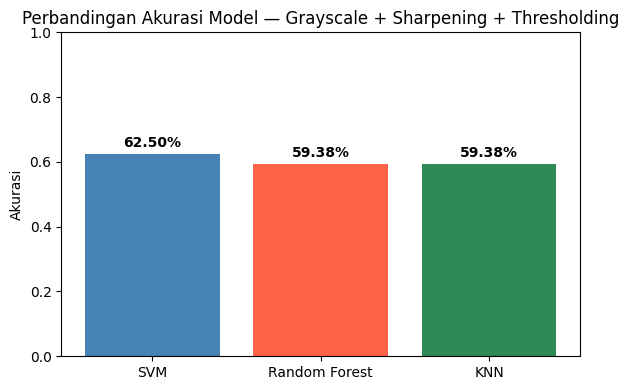

In [17]:
df_akurasi = pd.DataFrame(list(hasil_akurasi.items()), columns=['Model', 'Akurasi'])
df_akurasi = df_akurasi.sort_values('Akurasi', ascending=False).reset_index(drop=True)
print(df_akurasi.to_string(index=False))

plt.figure(figsize=(6, 4))
plt.bar(df_akurasi['Model'], df_akurasi['Akurasi'], color=['steelblue', 'tomato', 'seagreen'])
plt.ylim(0, 1)
plt.ylabel('Akurasi')
plt.title('Perbandingan Akurasi Model — Grayscale + Sharpening + Thresholding')
for i, acc in enumerate(df_akurasi['Akurasi']):
    plt.text(i, acc + 0.02, f'{acc:.2%}', ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

## 15. Confusion Matrix per Model (Validation Set)

Confusion matrix ditampilkan untuk masing-masing model. Dari sini kita bisa melihat tidak hanya akurasi keseluruhan, tapi juga seberapa sering model salah mengklasifikasikan Benign sebagai Malignant (atau sebaliknya), yang penting untuk konteks medis seperti deteksi kanker kulit.

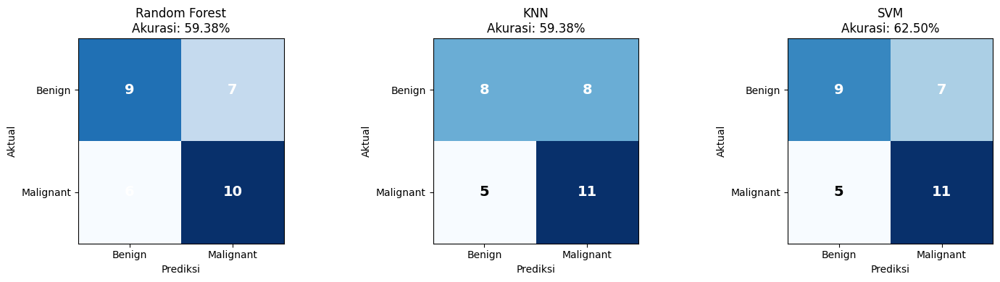

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, (nama, y_pred) in zip(axes, hasil_prediksi.items()):
    cm = confusion_matrix(y_val, y_pred)
    im = ax.imshow(cm, cmap='Blues')
    ax.set_title(f'{nama}\nAkurasi: {hasil_akurasi[nama]:.2%}')
    ax.set_xlabel('Prediksi')
    ax.set_ylabel('Aktual')
    ax.set_xticks([0, 1]); ax.set_xticklabels(['Benign', 'Malignant'])
    ax.set_yticks([0, 1]); ax.set_yticklabels(['Benign', 'Malignant'])
    for i in range(2):
        for j in range(2):
            ax.text(j, i, cm[i, j], ha='center', va='center',
                    color='white' if cm[i, j] > cm.max() / 2 else 'black',
                    fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

## 16. Prediksi pada Dataset Test (Tanpa Label)
Menggunakan model yang sudah dilatih untuk memprediksi label gambar di `Dataset/Test/`.

Hasil prediksi ketiga model terhadap 216 gambar Test disimpan ke file `prediksi_test.csv`. Setiap baris berisi nama file gambar beserta prediksi dari masing-masing model (Benign atau Malignant).

In [19]:
df_pred_test = pd.DataFrame({'Filename': test_filenames})

for nama, y_pred in prediksi_test.items():
    df_pred_test[nama] = ['Benign' if p == 0 else 'Malignant' for p in y_pred]

df_pred_test.to_csv('prediksi_test.csv', index=False)
print('Hasil prediksi disimpan ke prediksi_test.csv')
df_pred_test.head(15)

Hasil prediksi disimpan ke prediksi_test.csv


,Filename,Random Forest,KNN,SVM
0,1.jpg,Benign,Benign,Benign
1,10.jpg,Benign,Benign,Benign
2,108.jpg,Benign,Benign,Malignant
3,109.jpg,Malignant,Malignant,Malignant
4,11.jpg,Malignant,Malignant,Malignant
5,110.jpg,Malignant,Malignant,Benign
6,111.jpg,Malignant,Malignant,Malignant
7,112.jpg,Malignant,Malignant,Malignant
8,113.jpg,Malignant,Malignant,Malignant
9,114.jpg,Malignant,Malignant,Malignant


## 17. Distribusi Prediksi per Model

Sebagai penutup, kita tampilkan distribusi hasil prediksi tiap model dalam bentuk bar chart. Ini membantu kita melihat apakah ada perbedaan signifikan dalam kecenderungan prediksi antar model, misalnya apakah salah satu model lebih condong memprediksi Malignant dibanding yang lain.

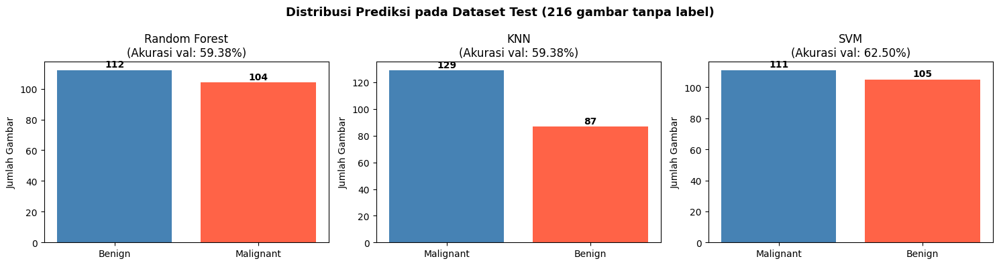

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, nama in zip(axes, models.keys()):
    counts = df_pred_test[nama].value_counts()
    ax.bar(counts.index, counts.values, color=['steelblue', 'tomato'])
    ax.set_title(f'{nama}\n(Akurasi val: {hasil_akurasi[nama]:.2%})')
    ax.set_ylabel('Jumlah Gambar')
    for i, v in enumerate(counts.values):
        ax.text(i, v + 2, str(v), ha='center', fontweight='bold')

plt.suptitle('Distribusi Prediksi pada Dataset Test (216 gambar tanpa label)',
              fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()